In [1]:
import scanpy as sc
import scvelo as scv
scv.set_figure_params(figsize=(3.5,3.5))
import matplotlib.pyplot as plt
import scFates as scf
scf.set_figure_pubready()

In [2]:
adata=sc.read("data/adata_aligned.h5ad")
adata_HC=sc.read("data/adata_HC.h5ad")

In [3]:
adata.obs["annot"]=adata.obs.leiden.astype(str)
adata_HC.obs.leiden=adata_HC.obs.leiden.replace(["0","1"],["IHC","OHC"])

In [4]:
adata.obs.loc[adata_HC[adata_HC.obs.leiden=="IHC"].obs_names,"annot"]="IHC"
adata.obs.loc[adata_HC[adata_HC.obs.leiden=="OHC"].obs_names,"annot"]="OHC"

In [5]:
adata.obs.annot.unique()

array(['2', '19', '1', '3', '17', '13', '15', '10', '8', '4', '6', '5',
       '18', '7', '16', '14', '11', '12', '9', 'IHC', 'OHC'], dtype=object)

In [6]:
sc.tl.rank_genes_groups(adata,"annot")

... storing 'annot' as categorical


In [7]:
import numpy as np
HC_markers=np.unique(sc.get.rank_genes_groups_df(adata,"IHC",pval_cutoff=0.05,log2fc_min=0).names.tolist()+sc.get.rank_genes_groups_df(adata,"OHC",pval_cutoff=0.05,log2fc_min=0).names.tolist())

In [8]:
HC_markers

array(['0610007P14Rik', '0610009B22Rik', '0610009L18Rik', ..., 'Zxdc',
       'Zyx', 'Zzz3'], dtype='<U15')

In [9]:
import numpy as np
adata.X=np.expm1(adata.X)
sc.pp.normalize_total(adata,target_sum=1e6)
sc.pp.log1p(adata,base=10)

In [10]:
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython

In [11]:
genes = adata.var_names

In [12]:
%%R -i genes

require("biomaRt")
human = useMart("ensembl", dataset = "hsapiens_gene_ensembl")
mouse = useMart("ensembl", dataset = "mmusculus_gene_ensembl")
#listAttributes(mouse)


Error in bmRequest(request = request, verbose = verbose) : 
  Internal Server Error (HTTP 500).


In [13]:
%%R -o genesV2

genesV2 = getLDS(attributes = c("external_gene_name"), filters = "external_gene_name", values = genes , mart = mouse, attributesL = c("hgnc_symbol"), martL = human)


Error in martCheck(mart) : object 'mouse' not found


In [11]:
genesV2=genesV2.set_index("Gene.name")
genesV2=genesV2.loc[genesV2.index.isin(adata.var_names)]
adata=adata[:,genesV2.index]
adata.var_names=genesV2.values.ravel()
adata.var_names_make_unique()

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [12]:
import pandas as pd
meta=pd.DataFrame({"Cells":adata.obs_names,"cell_type":adata.obs.annot})
meta.to_csv("meta_cellphonedb.txt",sep="\t",index=False)
adata.write("adata_tocellphonedb.h5ad")

... storing 'annot' as categorical


run on bash:
```bash
cellphonedb method statistical_analysis meta_cellphonedb.txt adata_tocellphonedb.h5ad --counts-data=hgnc_symbol --threads=40 --output-path=cellphonedb
```

In [13]:
g=adata.obs.groupby(["devtime","leiden"])
g.count().loc["E18.5"]

,batch,plate,n_genes_by_counts,total_counts,total_counts_ERCC,pct_counts_ERCC,annot
leiden,,,,,,,
1,0,0,0,0,0,0,0
2,14,14,14,14,14,14,14
3,1,1,1,1,1,1,1
4,6,6,6,6,6,6,6
5,1,1,1,1,1,1,1
6,5,5,5,5,5,5,5
7,46,46,46,46,46,46,46
8,0,0,0,0,0,0,0
9,44,44,44,44,44,44,44


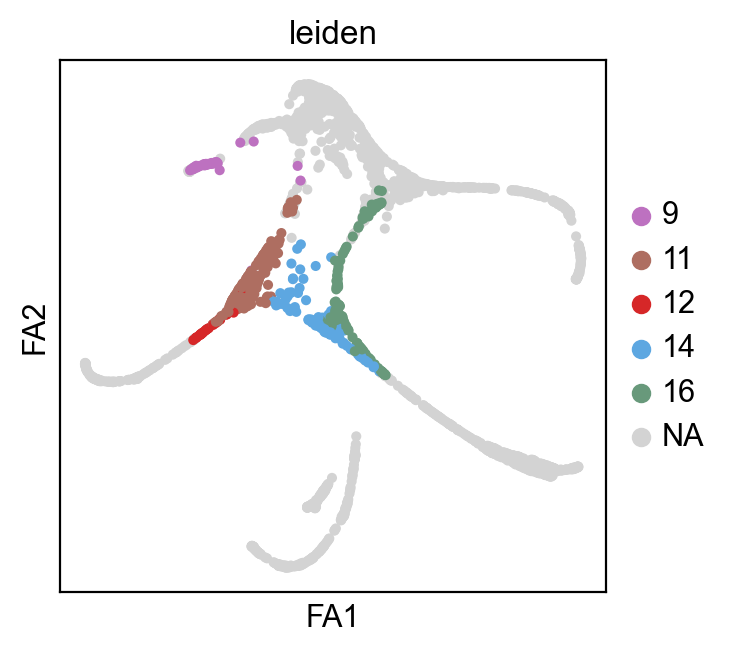

In [14]:
sc.pl.draw_graph(adata,color="leiden",groups=["9","11","12","14","16"])

In [15]:
import scFates as scf
#newcol=adata.uns["leiden_colors"][:16].copy()
adata_tree=sc.read("data/adata_tree.h5ad")
#adata_tree.uns["leiden_colors"]=newcol


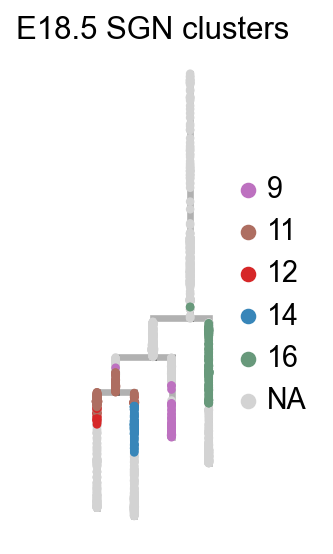

In [16]:
sc.set_figure_params(figsize=(1,4))
scf.pl.dendrogram(adata_tree,color="leiden",groups=["9","11","12","14","16"],
                  frameon=False,tree_behind=True,title="E18.5 SGN clusters")

In [17]:
pvals=pd.read_table("cellphonedb/pvalues.txt")
means=pd.read_table("cellphonedb/means.txt")
pvals.set_index("interacting_pair",inplace=True)
means.set_index("interacting_pair",inplace=True)

In [18]:
ohc=["OHC|"+l for l in ["9","11","12","14","16"]]+[l+"|OHC" for l in ["9","11","12","14","16"]]
ihc=["IHC|"+l for l in ["9","11","12","14","16"]]+[l+"|IHC" for l in ["9","11","12","14","16"]]

In [19]:
pvals_ohc=pvals[ohc]
means_ohc=means[ohc]
means_ohc=means_ohc.loc[(pvals_ohc<0.05).apply(any,axis=1)]
pvals_ohc=pvals_ohc.loc[(pvals_ohc<0.05).apply(any,axis=1)]
pvals_ohc[pvals_ohc==0]=0.0009
mask=pvals_ohc<0.05
pvals_ohc=-np.log10(pvals_ohc)
pvals_ohc=pvals_ohc/pvals_ohc.max().max()*200

In [21]:
from matplotlib import cm
from matplotlib.cm import Reds
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def dotplot(pvals,means):

    fig,ax=plt.subplots(figsize=(4,0.365*pvals.shape[0]))

    xs = np.arange(pvals.shape[0])
    ys = np.arange(pvals.shape[1])
    X, Y = np.meshgrid(xs, ys)

    sc=ax.scatter(
        Y, X, s=pvals.values.T,c=means.values.T,cmap="Reds"
    )
    ax.set_ylim([-0.5,pvals.shape[0]-0.5]);
    ax.set_yticks(range(pvals.shape[0]));
    ax.set_yticklabels(pvals.index);

    ax.set_xticks(range(10));
    ax.set_xticklabels(pvals.columns,rotation=90);
    handles, labels = sc.legend_elements(prop="sizes",num=4)
    legend = ax.legend(handles, ["0.75","1.5","2.25","3"], title="-log10(pval)",frameon=False,
                       loc='center left', bbox_to_anchor=(1, 0.5),handlelength=2, borderpad=1.2)
    legend._legend_box.align = "left"
    mappable = cm.ScalarMappable(cmap=Reds)
    
    position = inset_axes(ax, width=0.2, height=1,
                    bbox_to_anchor=(1.04, .5-3/fig.get_size_inches()[1]),
                    bbox_transform=ax.transAxes, loc=3, borderpad=1.2)
    
    #position=fig.add_axes([1.04,0.4,.5/fig.get_size_inches()[1],2/fig.get_size_inches()[1]])
    cbar=fig.colorbar(mappable, cax=position,orientation='vertical',aspect=50)
    cbar.set_ticks([0,1])
    cbar.set_ticklabels([0,means.max().max()])
    cbar.ax.set_title("log2 mean(mol1,mol2)",loc="left")

In [22]:
scv.set_figure_params(figsize=(3.5,3.5))

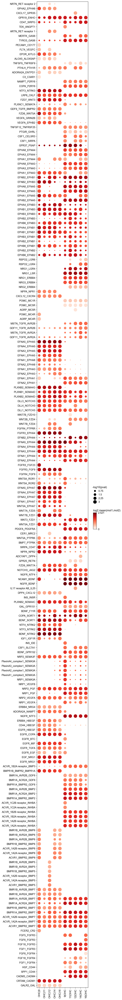

In [23]:
dotplot(pvals_ohc,means_ohc)

In [24]:
res=[]
for i in range(pvals_ohc.shape[0]):
    res=res+[(pvals_ohc.iloc[i,:5].diff().max(),pvals_ohc.iloc[i,5:].diff().max())]

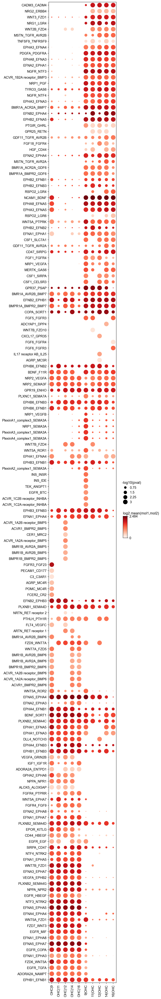

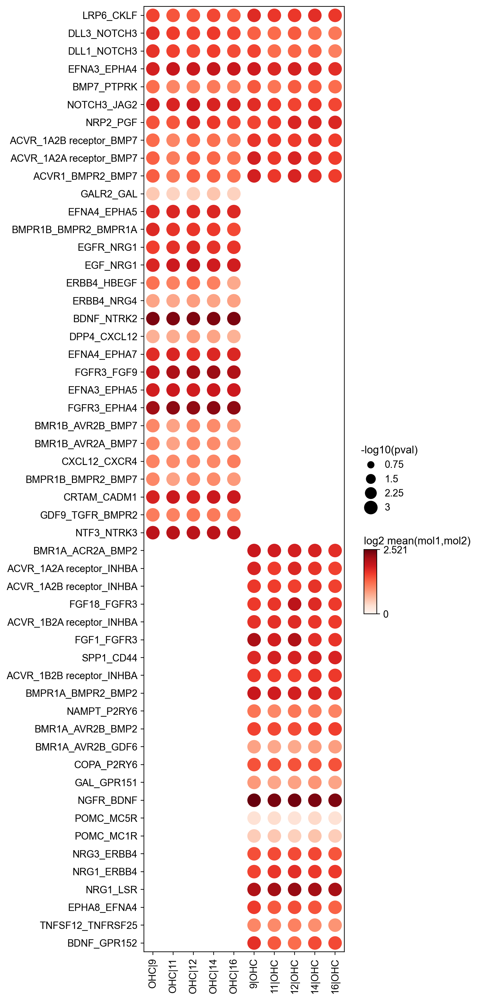

In [25]:
res=[]
for i in range(pvals_ohc.shape[0]):
    res=res+[all((pvals_ohc.iloc[i,:5].std()==0,pvals_ohc.iloc[i,5:].std()==0))]
pvals_sel=pvals_ohc.loc[~np.array(res)]
means_sel=means_ohc.loc[~np.array(res)]

ordered=pvals_sel.T.corr().iloc[0,:].sort_values().index
dotplot(pvals_ohc.loc[ordered],means_ohc.loc[ordered])
plt.savefig("figures/cpdb_ohc_sel.pdf",bbox_inches="tight")

pvals_sel=pvals_ohc.loc[np.array(res)]
means_sel=means_ohc.loc[np.array(res)]

ordered=pvals_sel.T.corr().iloc[0,:].sort_values().index
dotplot(pvals_ohc.loc[ordered],means_ohc.loc[ordered])
plt.savefig("figures/cpdb_ohc_full.pdf",bbox_inches="tight")

In [26]:
pvals_ihc=pvals[ihc]
means_ihc=means[ihc]
means_ihc=means_ihc.loc[(pvals_ihc<0.05).apply(any,axis=1)]
pvals_ihc=pvals_ihc.loc[(pvals_ihc<0.05).apply(any,axis=1)]
pvals_ihc[pvals_ihc==0]=0.0009
mask=pvals_ihc<0.05
pvals_ihc=-np.log10(pvals_ihc)
pvals_ihc=pvals_ihc/pvals_ihc.max().max()*200

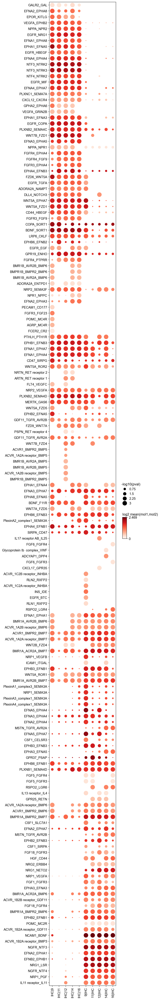

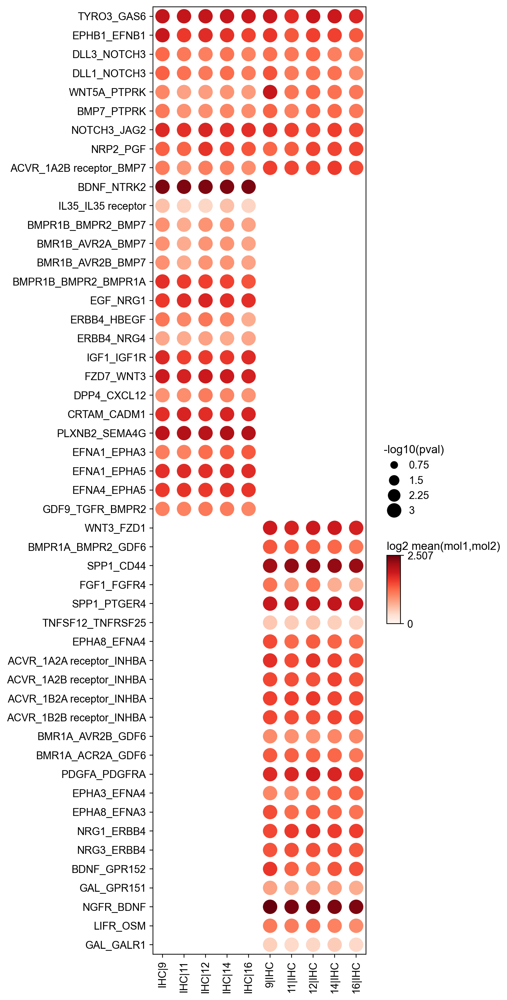

In [27]:
res=[]
for i in range(pvals_ihc.shape[0]):
    res=res+[all((pvals_ihc.iloc[i,:5].std()==0,pvals_ihc.iloc[i,5:].std()==0))]
pvals_sel=pvals_ihc.loc[~np.array(res)]
means_sel=means_ihc.loc[~np.array(res)]

ordered=pvals_sel.T.corr().iloc[0,:].sort_values().index
dotplot(pvals_ihc.loc[ordered],means_ihc.loc[ordered])
plt.savefig("figures/cpdb_ihc_sel.pdf",bbox_inches="tight")

pvals_sel=pvals_ihc.loc[np.array(res)]
means_sel=means_ihc.loc[np.array(res)]

ordered=pvals_sel.T.corr().iloc[0,:].sort_values().index
dotplot(pvals_ihc.loc[ordered],means_ihc.loc[ordered])
plt.savefig("figures/cpdb_ihc_full.pdf",bbox_inches="tight")

In [28]:
res=pd.DataFrame(False,index=mask.index,columns=mask.columns)
for c in mask.columns:
    for g in mask.index:
        if mask.loc[g,c] & (all([type(e)==str for e in pvals.loc[g,["gene_a","gene_b"]]])):
            c1,c2=c.split("|")
            exp1=adata[adata.obs.annot==c1,pvals.loc[g,["gene_a"]]].X.mean()
            exp2=adata[adata.obs.annot==c2,pvals.loc[g,["gene_b"]]].X.mean()
            res.loc[g,c]=all(np.array([exp1,exp2])>1)
        else:
            res.loc[g,c]=False

,OHC|9,OHC|11,OHC|12,OHC|14,OHC|16,9|OHC,11|OHC,12|OHC,14|OHC,16|OHC
interacting_pair,,,,,,,,,,
CADM3_CADM4,0.000,0.000,0.000,0.000,0.000,1.774,1.904,1.927,1.899,1.857
EGFR_EGF,0.661,0.678,0.649,0.804,0.687,0.889,0.796,0.000,0.789,0.789
EGFR_TGFA,1.270,1.060,1.226,1.242,1.201,0.681,0.587,0.000,0.581,0.581
EGFR_BTC,0.659,0.617,0.000,0.611,0.612,0.913,0.820,0.000,0.814,0.814
EGFR_COPA,1.797,1.792,1.803,1.792,1.799,1.299,1.206,0.000,1.200,1.199
...,...,...,...,...,...,...,...,...,...,...
NAMPT_P2RY6,0.000,0.905,0.000,0.000,0.000,1.172,1.031,1.153,1.106,1.065
PTHLH_PTH1R,0.651,0.878,1.048,1.078,1.011,1.138,1.089,1.179,1.169,1.080
MERTK_GAS6,1.261,1.244,1.238,1.236,1.183,1.462,1.255,1.250,1.304,1.300


In [37]:
means_ohc=means_ohc.loc[res.apply(any,axis=1).values]
pvals_ohc=pvals_ohc.loc[res.apply(any,axis=1).values]


Text(0.0, 1.0, 'log2 mean(mol1,mol2)')

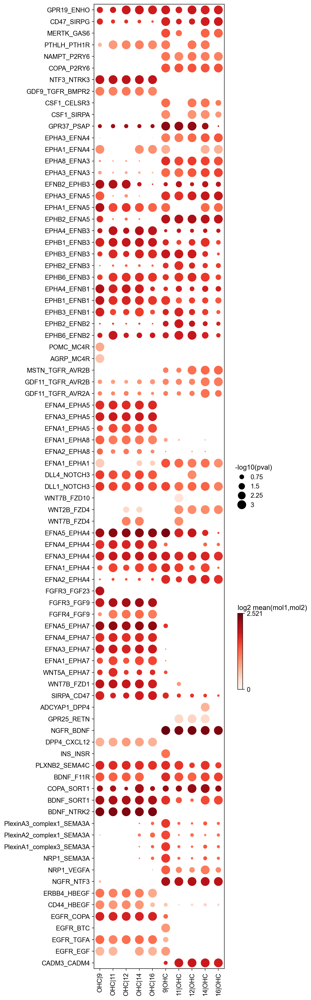

In [38]:
fig,ax=plt.subplots(figsize=(4,0.365*pvals_ohc.shape[0]))

xs = np.arange(pvals_ohc.shape[0])
ys = np.arange(pvals_ohc.shape[1])
X, Y = np.meshgrid(xs, ys)

sc=ax.scatter(
    Y, X, s=pvals_ohc.values.T,c=means_ohc.values.T,cmap="Reds"
)
ax.set_ylim([-0.5,pvals_ohc.shape[0]-0.5]);
ax.set_yticks(range(pvals_ohc.shape[0]));
ax.set_yticklabels(pvals_ohc.index);

ax.set_xticks(range(10));
ax.set_xticklabels(pvals_ohc.columns,rotation=90);
handles, labels = sc.legend_elements(prop="sizes",num=4)
legend = ax.legend(handles, ["0.75","1.5","2.25","3"], title="-log10(pval)",frameon=False,
                   loc='center left', bbox_to_anchor=(1, 0.5),handlelength=2, borderpad=1.2)
legend._legend_box.align = "left"
mappable = cm.ScalarMappable(cmap=Reds)

position=fig.add_axes([1.04,0.37,0.03,0.06])
cbar=fig.colorbar(mappable, cax=position,orientation='vertical')
cbar.set_ticks([0,1])
cbar.set_ticklabels([0,means_ohc.max().max()])
cbar.ax.set_title("log2 mean(mol1,mol2)",loc="left")

Text(0.0, 1.0, 'log2 mean(mol1,mol2)')

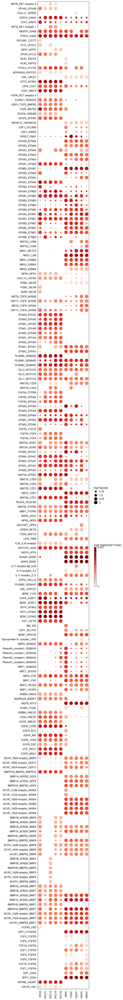

In [39]:
from matplotlib import cm
from matplotlib.cm import Reds
fig,ax=plt.subplots(figsize=(4,0.365*pvals_ihc.shape[0]))

xs = np.arange(pvals_ihc.shape[0])
ys = np.arange(pvals_ihc.shape[1])
X, Y = np.meshgrid(xs, ys)

sc=ax.scatter(
    Y, X, s=pvals_ihc.values.T,c=means_ihc.values.T,cmap="Reds"
)
ax.set_ylim([-0.5,pvals_ihc.shape[0]-0.5]);
ax.set_yticks(range(pvals_ihc.shape[0]));
ax.set_yticklabels(pvals_ihc.index);

ax.set_xticks(range(10));
ax.set_xticklabels(pvals_ihc.columns,rotation=90);
handles, labels = sc.legend_elements(prop="sizes",num=4)
legend = ax.legend(handles, ["0.75","1.5","2.25","3"], title="-log10(pval)",frameon=False,
                   loc='center left', bbox_to_anchor=(1, 0.5),handlelength=2, borderpad=1.2)
legend._legend_box.align = "left"
mappable = cm.ScalarMappable(cmap=Reds)

position=fig.add_axes([1.04,0.46,0.03,0.03])
cbar=fig.colorbar(mappable, cax=position,orientation='vertical')
cbar.set_ticks([0,1])
cbar.set_ticklabels([0,means_ihc.max().max()])
cbar.ax.set_title("log2 mean(mol1,mol2)",loc="left")

In [40]:
res=pd.DataFrame(False,index=mask.index,columns=mask.columns)
for c in mask.columns:
    for g in mask.index:
        if mask.loc[g,c] & (all([type(e)==str for e in pvals.loc[g,["gene_a","gene_b"]]])):
            c1,c2=c.split("|")
            exp1=adata[adata.obs.annot==c1,pvals.loc[g,["gene_a"]]].X.mean()
            exp2=adata[adata.obs.annot==c2,pvals.loc[g,["gene_b"]]].X.mean()
            res.loc[g,c]=all(np.array([exp1,exp2])>1)
        else:
            res.loc[g,c]=False

In [298]:
means_ihc=means_ihc.loc[res.apply(any,axis=1)]
pvals_ihc=pvals_ihc.loc[res.apply(any,axis=1)]


Text(0.0, 1.0, 'log2 mean(mol1,mol2)')

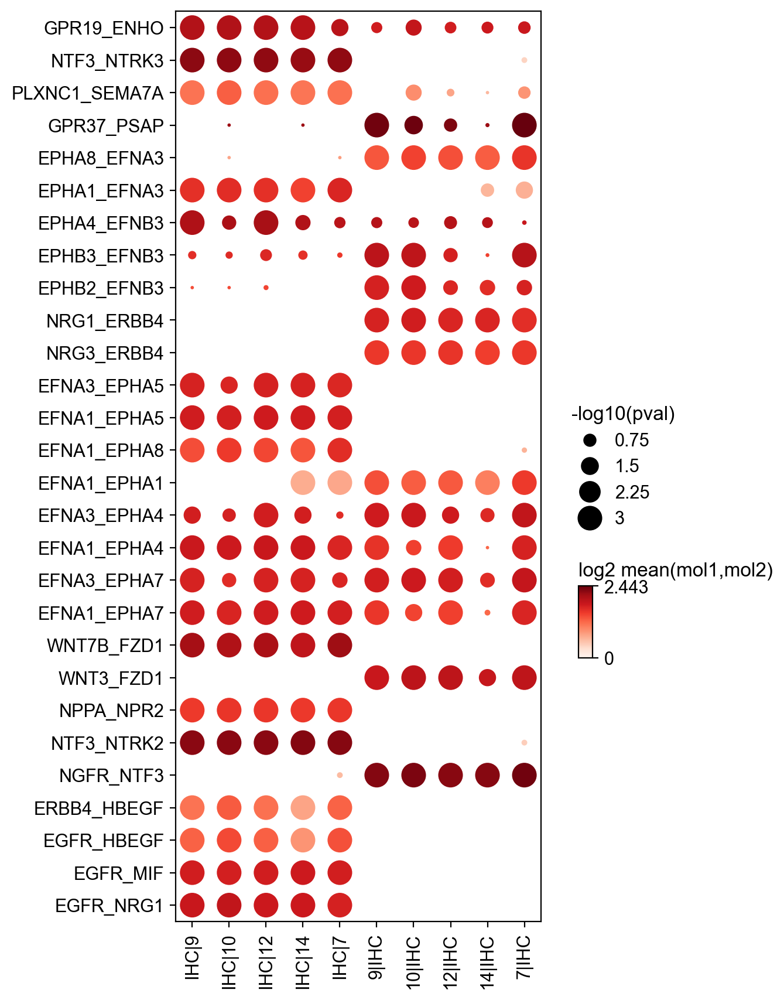

In [299]:
from matplotlib import cm
from matplotlib.cm import Reds
fig,ax=plt.subplots(figsize=(4,0.365*pvals_ihc.shape[0]))

xs = np.arange(pvals_ihc.shape[0])
ys = np.arange(pvals_ihc.shape[1])
X, Y = np.meshgrid(xs, ys)

sc=ax.scatter(
    Y, X, s=pvals_ihc.values.T,c=means_ihc.values.T,cmap="Reds"
)
ax.set_ylim([-0.5,pvals_ihc.shape[0]-0.5]);
ax.set_yticks(range(pvals_ihc.shape[0]));
ax.set_yticklabels(pvals_ihc.index);

ax.set_xticks(range(10));
ax.set_xticklabels(pvals_ihc.columns,rotation=90);
handles, labels = sc.legend_elements(prop="sizes",num=4)
legend = ax.legend(handles, ["0.75","1.5","2.25","3"], title="-log10(pval)",frameon=False,
                   loc='center left', bbox_to_anchor=(1, 0.5),handlelength=2, borderpad=1.2)
legend._legend_box.align = "left"
mappable = cm.ScalarMappable(cmap=Reds)

position=fig.add_axes([1.04,0.37,0.03,0.06])
cbar=fig.colorbar(mappable, cax=position,orientation='vertical')
cbar.set_ticks([0,1])
cbar.set_ticklabels([0,means_ihc.max().max()])
cbar.ax.set_title("log2 mean(mol1,mol2)",loc="left")

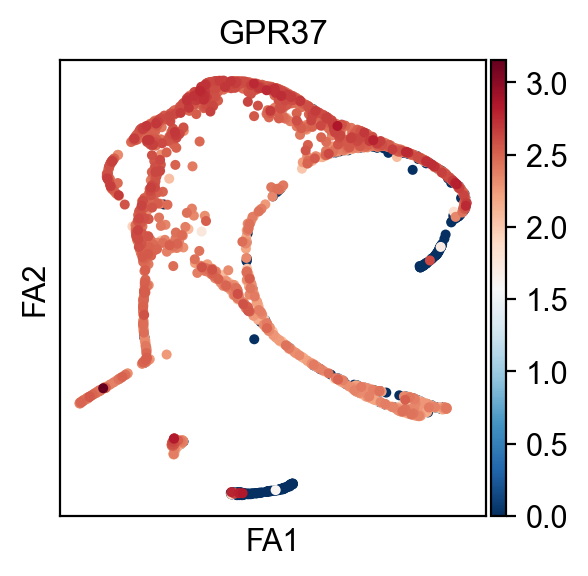

In [302]:
import scanpy as sc
sc.pl.draw_graph(adata,color="GPR37")